# STA141B Final Project: Gun Violence Analysis in California

Last Update: 2019.3.14

In [70]:
#useful packages
import pandas as pd
import numpy as np
from datetime import datetime

#visualization
from plotnine import *
import matplotlib.pyplot as plt
import seaborn as sns

#text parsing packages
import nltk
import nltk.corpus as corpus
import re
import string
from nltk.corpus import wordnet

%matplotlib inline

In [71]:
#plotly packages to make interactive plots
#plotly.tools.set_credentials_file(username='a90684255', api_key='nDlVOTAxJ6kGnTnAzCoA')
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode(connected=True)
from plotly import tools
import plotly.tools as tls

import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=True, world_readable=False, theme='ggplot')

In [72]:
#read the data
path = "/Users/applewin/Desktop/final proejct/gun-violence-data_01-2013_03-2018.csv"
gun = pd.read_csv(path)
#subset to california
ca = gun[gun["state"] == "California"]
#subset to sf
sf = gun[gun["city_or_county"] == "San Francisco"]
del gun #save storge

Credit to: https://www.gunviolencearchive.org
data description: https://github.com/jamesqo/gun-violence-data

According to the author of this dataset, there are two missing incidents in this dataset, but none of them are in California so we ignore them for this project. This dataset includes information about gun violence from 2013.01 to 2018.03

In [73]:
#data preparation
def prepare_data(df):
    #change the data type of date and get month,weekday,year from the date column
    df['date'] = pd.to_datetime(df['date'])
    df['month'] = df['date'].dt.month
    df['day'] = df['date'].dt.day
    df['year'] = df['date'].dt.year
    df['weekday'] = df['date'].dt.weekday
    #define total as n_killed+n_injured
    df["total"] = df.n_killed + df.n_injured
    
    #map names to weekday and month
    dfmap = {0:'Monday',1:'Tueday',2:'Wednesday',3:'Thursday',4:'Friday',5:'Saturday',6:'Sunday'}
    df['weekday'] = df['weekday'].map(dfmap)
    month_map = {1 :"Jan",2 :"Feb",3 :"Mar",4 :"Apr",5 : "May",6 : "Jun",7 : "Jul",8 :"Aug",9 :"Sep",10 :"Oct",11 :"Nov",12 :"Dec"}
    df['month'] = df['month'].map(month_map)
    return df

#subset to ca and sf
gun_ca = prepare_data(ca)
gun_sf = prepare_data(sf)

In [35]:
gun_ca.shape

(16306, 34)

In [19]:
gun_ca.head()

,incident_id,date,state,city_or_county,address,n_killed,n_injured,incident_url,source_url,incident_url_fields_missing,...,participant_status,participant_type,sources,state_house_district,state_senate_district,month,day,year,weekday,total
1,460726,2013-01-01,California,Hawthorne,13500 block of Cerise Avenue,1,3,http://www.gunviolencearchive.org/incident/460726,http://www.dailybulletin.com/article/zz/201301...,False,...,0::Killed||1::Injured||2::Injured||3::Injured,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://losangeles.cbslocal.com/2013/01/01/man-...,62.0,35.0,Jan,1,2013,Tueday,4
8,479389,2013-01-21,California,Brentwood,1100 block of Breton Drive,0,4,http://www.gunviolencearchive.org/incident/479389,http://sanfrancisco.cbslocal.com/2013/01/22/4-...,False,...,0::Injured||1::Injured||2::Injured||3::Injured...,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://www.contracostatimes.com/ci_22426767/br...,11.0,7.0,Jan,21,2013,Monday,4
16,479580,2013-02-03,California,Yuba (county),5800 block of Poplar Avenue,1,3,http://www.gunviolencearchive.org/incident/479580,http://sacramento.cbslocal.com/2013/02/04/1-de...,False,...,0::Killed||1::Injured||2::Injured||3::Injured|...,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://news.asiantown.net/r/28306/no-death-pen...,3.0,4.0,Feb,3,2013,Sunday,4
19,480311,2013-02-11,California,Vallejo,800 block of Humboldt Street,1,4,http://www.gunviolencearchive.org/incident/480311,http://archive.news10.net/news/article/229997/...,False,...,0::Killed||1::Injured||2::Injured||3::Injured|...,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://www.timesheraldonline.com/article/ZZ/20...,14.0,3.0,Feb,11,2013,Monday,5
22,480358,2013-02-19,California,Orange (county),Katella Avenue,4,3,http://www.gunviolencearchive.org/incident/480358,http://www.dailymail.co.uk/news/article-228117...,False,...,0::Killed||1::Injured||2::Injured||3::Injured|...,0::Victim||1::Victim||2::Victim||3::Victim||4:...,http://www.nydailynews.com/news/national/2-sou...,72.0,34.0,Feb,19,2013,Tueday,7


In [20]:
gun_ca.isnull().sum()

incident_id                        0
date                               0
state                              0
city_or_county                     0
address                          648
n_killed                           0
n_injured                          0
incident_url                       0
source_url                        34
incident_url_fields_missing        0
congressional_district           514
gun_stolen                      6727
gun_type                        6726
incident_characteristics          17
latitude                         314
location_description           14055
longitude                        314
n_guns_involved                 6726
notes                           9116
participant_age                 7070
participant_age_group           2491
participant_gender              1946
participant_name                8905
participant_relationship       15240
participant_status              1704
participant_type                1065
sources                           27
s

When is the most dangerous time in California for gun violence from 2013 to 2017?

In [74]:
#exclude data for 2018
gun_ca17 = gun_ca[~(gun_ca["year"] == 2018)]
gun_sf17 = gun_sf[~(gun_sf["year"] == 2018)]

In [75]:
#plot incidents,injured,killed by year in california year wise
#get the columns we need
cols = ['n_killed', 'n_injured', 'total','month','day','year','weekday']
gun_time = gun_ca17[cols]
gun_by_year = gun_time[['year','n_killed','n_injured', 'total']].groupby('year').sum()

In [48]:
trace1 = go.Scatter(
                    x = gun_by_year.reset_index()['year'],
                    y = gun_by_year.reset_index()['total'],
                    mode = "lines+markers",
                    name = "Total hurts",
                    text= "")

trace2 = go.Scatter(
                    x = gun_by_year.reset_index()['year'],
                    y = gun_by_year.reset_index()['n_killed'],
                    mode = "lines+markers",
                    name = "Number of killed",
                    text= "")

trace3 = go.Scatter(
                    x = gun_by_year.reset_index()['year'],
                    y = gun_by_year.reset_index()['n_injured'],
                    mode = "lines+markers",
                    name = "Number of injured",
                    text= "")

data = [trace1,trace2,trace3]
layout = dict(title = 'Total number of incidents,number of killed, number of injured from 2013 to 2017 in California',
              xaxis= dict(title= 'Year',ticklen= 5,zeroline= False),
              yaxis= dict(title= 'Count',ticklen= 5,zeroline= False)
             )
fig = dict(data = data, layout = layout)
iplot(fig)

click here to view the plot [incidents year](https://plot.ly/~a906842455/5/)

In [49]:
#plot total number of incidents in CA by month
gun_by_month = gun_time[['month','n_killed','n_injured', 'total']].groupby('month').sum()
gun_by_month.iplot(kind = 'bar', xTitle = 'month', yTitle = "Count", 
                   title ="Total number of incidents,number of killed, number of injured for each month in California",
                   filename='month wise', world_readable=True)

click here to view the plot [incidents month](https://plot.ly/~a906842455/9/)

In [50]:
#plot number of killed, injured, incidents for each weekday in CA
gun_by_weekday = gun_time[['weekday','n_killed','n_injured', 'total']].groupby('weekday').sum()
gun_by_weekday.iplot(kind = 'bar', xTitle = 'weekday', yTitle = "Count", 
                     title ="Total number of incidents,injured,killed for each weekday in California",
                     filename='weekday wise', world_readable=True)

click here to view the plot [incidents weekday](https://plot.ly/~a906842455/7/)

Where is the most dangerous place in California for gun violence?

In [51]:
#get cities that have top 20 number of incidents
gun_by_city = pd.DataFrame(gun_ca17["city_or_county"].value_counts())
gun_by_top20_city = gun_by_city[0:19]

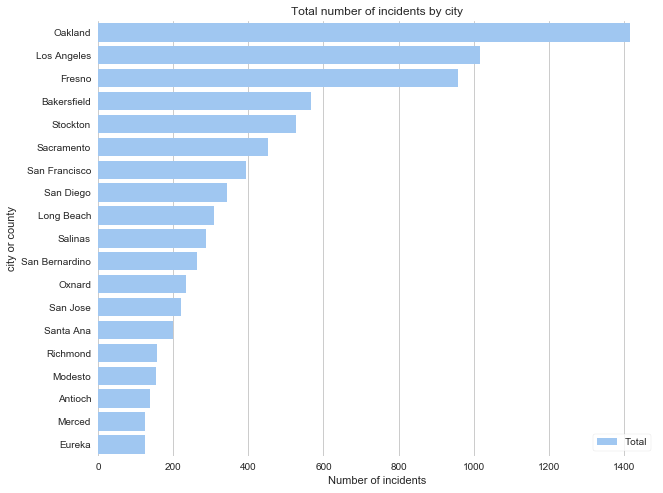

In [53]:
#plot top 20 highest cities(counties) with number of incidents
sns.set(style="whitegrid")
# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(10,8))
# Plot the total number of incidents
sns.set_color_codes("pastel")
sns.barplot(x="city_or_county",y=gun_by_top20_city.index, data=gun_by_top20_city, label="Total", color="b")

ax.legend(ncol=2, loc="lower right", frameon=True)
ax.set(ylabel="city or county",
       xlabel="Number of incidents",
       title = "Total number of incidents by city")
sns.despine(left=True, bottom=True)

plt.show()

In [56]:
#plot death rate for top 20 highest number of incidents cities
top20 = gun_by_top20_city.index.values.tolist()
cols = ['n_killed', 'n_injured', 'total','city_or_county']
gun_top20 = gun_ca17[gun_ca17['city_or_county'].isin(top20)]
gun_top20 = gun_top20[cols].groupby("city_or_county").sum()
gun_top20['death_rate'] = gun_top20['n_killed']/gun_top20['total']

In [57]:
gun_top20['death_rate'].iplot(kind = 'bar', xTitle = 'city', yTitle = "death rate", 
                              title ="Death rate for top 20 incidents city in California",filename='death rate city', world_readable=True)

click here to view the plot [death rate city](https://plot.ly/~a906842455/11/)

In [55]:
#read the data for population in California
path2 = "C:/Users/applewin/Desktop/RankCities_2018.xls"
population = pd.read_excel(path2, sheetname= 'Sheet1')
population

D:\anaconda\lib\site-packages\pandas\util\_decorators.py:188: FutureWarning: The `sheetname` keyword is deprecated, use `sheet_name` instead
  return func(*args, **kwargs)


,Rank,City,Population,gun_violence_incidents,incidents_per_1k_capital
0,8,Oakland 747,428827,1415,3.299699
1,1,Los Angeles,4054400,1017,0.250839
2,5,Fresno,538330,958,1.779578
3,9,Bakersfield,386839,568,1.468311
4,13,Stockton,315103,528,1.675643
5,6,Sacramento,501344,452,0.901577
6,4,San Francisco,883963,394,0.445720
7,2,San Diego,1419845,344,0.242280
8,7,Long Beach,478561,308,0.643596
9,33,Salinas,161784,286,1.767789


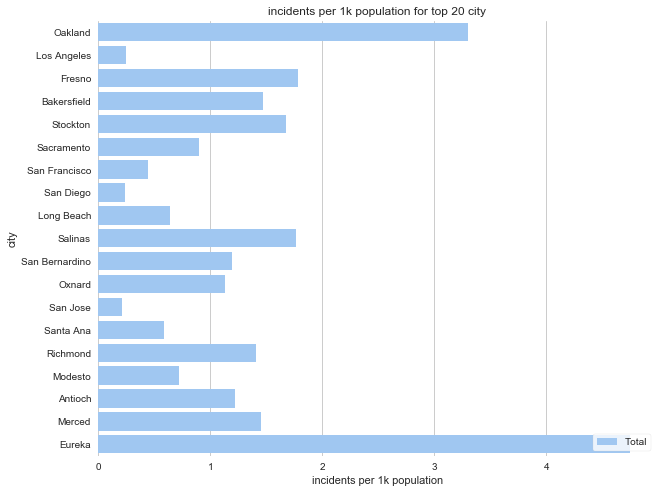

In [57]:
#plot Popilation adjusted incidents for previous top 20 highest cities
sns.set(style="whitegrid")
# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(10,8))
# Plot the total number of incidents
sns.set_color_codes("pastel")
sns.barplot(x="incidents_per_1k_capital",y=gun_by_top20_city.index, data=population, label="Total", color="b")

ax.legend(ncol=2, loc="lower right", frameon=True)
ax.set(ylabel="city",
       xlabel="incidents per 1k population",
       title = "incidents per 1k population for top 20 city")
sns.despine(left=True, bottom=True)

plt.show()

In [76]:
#text parsing for address, find most common words
from collections import Counter

address = "||".join(gun_sf17['address'].dropna()).split("||")
address = Counter(address).most_common(20)
address

[('780 S Airport Blvd', 15),
 ('Highway 101', 9),
 ('San Francisco International Airport', 5),
 ('780 South Airport Boulevard', 3),
 ('900 block of Ellsworth Street', 3),
 ('Harbor Road', 2),
 ('900 block of Market Street ', 2),
 ('100 block of Mason Street', 2),
 ('106 Sixth Street', 2),
 ('2300 block of Mission Street', 2),
 ('Embarcadero and Mission Street', 2),
 ('200 block of Genebern Way', 2),
 ('501 Twin Peaks Blvd', 2),
 ('San Francisco, CA 94128', 2),
 ('300 block of Serrano Drive', 2),
 ('200 block of Hahn Street', 2),
 ('I-80', 2),
 ('Turk St', 2),
 ('100 block of Eddy St', 2),
 ('3192 16th St', 1)]

In [77]:
#text parsing for incident characteristics, find most common words
incidents_description = "||".join(gun_ca17['incident_characteristics'].dropna()).split("||")
incidents_description = Counter(incidents_description)
# reference: https://docs.python.org/3/library/collections.html#collections.Counter.most_common

incidents_description.most_common(20)

[('Shot - Wounded/Injured', 5340),
 ('Shot - Dead (murder, accidental, suicide)', 4630),
 ('Non-Shooting Incident', 2822),
 ('Possession (gun(s) found during commission of other crimes)', 2209),
 ('Officer Involved Incident', 1814),
 ('Shots Fired - No Injuries', 1746),
 ('Gang involvement', 1238),
 ('Brandishing/flourishing/open carry/lost/found', 1209),
 ('Drive-by (car to street, car to car)', 1151),
 ('Possession of gun by felon or prohibited person', 1134),
 ('Drug involvement', 913),
 ('Armed robbery with injury/death and/or evidence of DGU found', 741),
 ('ATF/LE Confiscation/Raid/Arrest', 688),
 ('Officer Involved Shooting - subject/suspect/perpetrator killed', 631),
 ('Home Invasion', 447),
 ('Officer Involved Shooting - subject/suspect/perpetrator shot', 438),
 ('Institution/Group/Business', 422),
 ('Stolen/Illegally owned gun{s} recovered during arrest/warrant', 400),
 ('Officer Involved Incident - Weapon involved but no shots fired', 397),
 ('Domestic Violence', 385)]

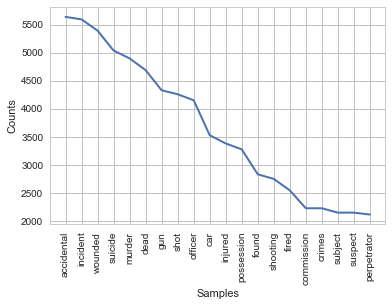

In [78]:
#text parsing for most frequent words
from nltk.corpus import wordnet

def all_character(df):
    """
    get all strings from incident characteristics of df, and then use strategy of split and
    nltk to filter out useful words from column.
    """
    
    incident_char = df.incident_characteristics.str.strip().astype(str)
    incident_char = "".join(incident_char)
    incident_char = re.split("[ ,.:;!' ''{''}''-''('')''/''|']", incident_char)
    incident_char = ' '.join(incident_char)
    incident_char = nltk.word_tokenize(incident_char)

    exclude = set(string.punctuation)
    exclude_more =["involved","no"]

    incident_char =[w.lower() for w in incident_char if w not in stopwords]
    incident_char = [w.lower() for w in incident_char if w not in exclude]
    incident_char = [w.lower() for w in incident_char if w not in exclude_more]

    return  incident_char 

stopwords = corpus.stopwords.words("english")
incident_char = all_character(gun_ca17)
freq_dis = nltk.FreqDist(incident_char)
freq_dis.plot(20)

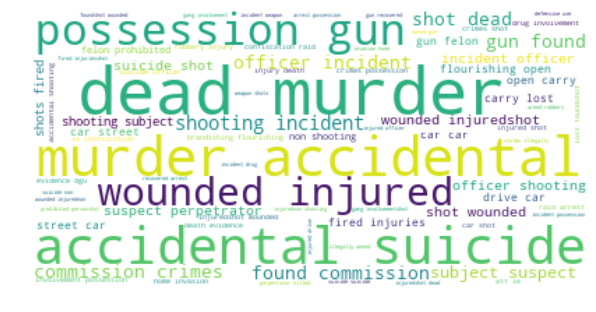

In [63]:
#plot the characteristics
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

incident_char = all_character(gun_ca17)
incident_char = ' '.join(incident_char)

wordcloud = WordCloud(background_color="white").generate(incident_char)
plt.figure(figsize=(10,8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

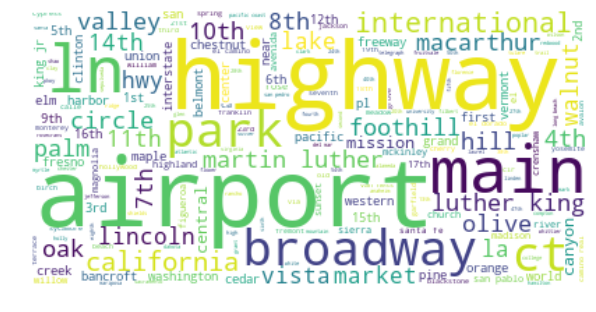

In [64]:
def all_address(df):
    """
    get all strings from address of df, and then use strategy of split and
    nltk to filter out useful words from column. get the unique street names 
    in order to find out most dangerous street and location.
    """
    address = df.address.str.strip().astype(str)
    address = " ".join(address)
    address = re.split("[ ,.:;!' ''{''}''-''('')''/''|']", address)
    address = ' '.join(address)
    address = nltk.word_tokenize(address)
    exclude = set(string.punctuation)
    stopwords = corpus.stopwords.words("english")
    address =[w.lower() for w in address if w not in stopwords]
    address = [w.lower() for w in address if w not in exclude]
    address = ' '.join(address)
    return address

address = all_address(gun_ca17)

stopwords = set(STOPWORDS)
stopwords.update(["drive", "avenue", "street", "parkway", "lane", "way", "block", "st", "ave",
                 "rd", "road", "dr", "east", "south", "west", "north", "streets", "boulevard",
                 "place", "court", "nan", "blvd", "avenues"])

wordcloud = WordCloud(stopwords=stopwords, background_color="white").generate(address)
plt.figure(figsize=(10,8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

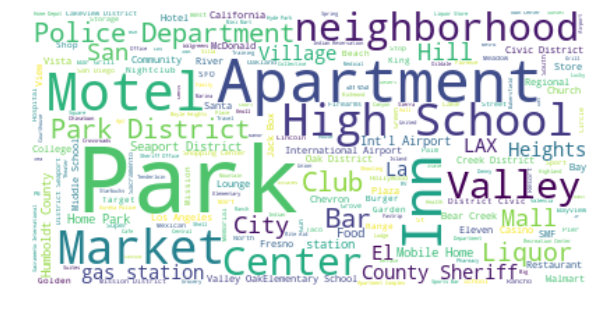

In [65]:
loca_desc = gun_ca17.location_description.dropna().str.strip().astype(str)
loca_desc = " ".join(loca_desc)

wordcloud = WordCloud(background_color="white").generate(loca_desc)
plt.figure(figsize=(10,8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

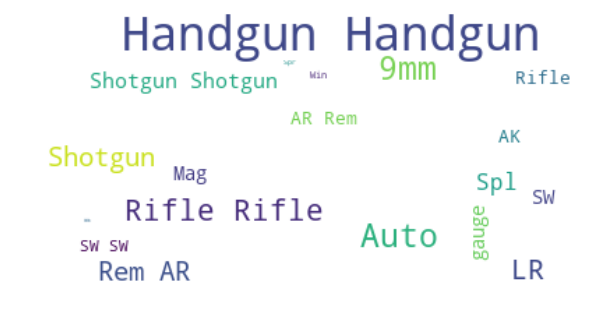

In [66]:
def all_gun(df):
    """
    get all strings from gun type of df, and then use strategy of split and
    nltk to filter out useful words from column. Finding out the most common gun
    fired in the incident.
    """
    gun_type = df.gun_type.dropna().str.strip().astype(str)
    gun_type = " ".join(gun_type)
    gun_type = re.split("[:'|''0']", gun_type)
    gun_type = list(filter(None, gun_type))
    gun_type = [x for x in gun_type if "Unknown " and "Unknown" not in x]
    gun_type = ' '.join(gun_type)
    return gun_type

gun_type = all_gun(gun_ca17)

wordcloud = WordCloud(background_color="white").generate(gun_type)
plt.figure(figsize=(10,8))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [38]:
#Get the SF police Station Location dataset:
from sodapy import Socrata

client = Socrata("data.sfgov.org", None) # credit to https://dev.socrata.com/foundry/data.sfgov.org/me2e-mc38
sfpd_results = client.get("me2e-mc38", limit=20)
results_df = pd.DataFrame.from_records(sfpd_results)
police_location = results_df.loc[:, 'address':'location']

sfpd_coor = []
i = 0
while i < len(police_location.location):
    sfpd_coor.append(police_location.location[i]["coordinates"])
    i = i + 1
police_location = police_location.drop(columns="location")
police_location["coordinates"] = sfpd_coor

In [39]:
#get longitude and latitude from coordinates
lon = pd.DataFrame(data=[x[0] for x in police_location['coordinates'].values])
lat = pd.DataFrame(data=[x[1] for x in police_location['coordinates'].values])
# add two new columns from lat and lon
police_location['latitude'] = lat
police_location['longitude'] = lon
police_location

,address,company_name,district_name,coordinates,latitude,longitude
0,766 VALLEJO ST,A,CENTRAL STN,"[-122.409863, 37.798645]",37.798645,-122.409863
1,1899 WALLER ST,F,PARK STN,"[-122.455267, 37.767849]",37.767849,-122.455267
2,2345 24TH AV,I,TARAVAL STN,"[-122.481461, 37.743734]",37.743734,-122.481461
3,201 WILLIAMS ST,C,BAYVIEW STN,"[-122.398087, 37.729642]",37.729642,-122.398087
4,850 BRYANT ST,B,SOUTHERN STN,"[-122.404328, 37.774989]",37.774989,-122.404328
5,461 6TH AV,G,RICHMOND STN,"[-122.464461, 37.780001]",37.780001,-122.464461
6,630 VALLENCIA ST,D,MISSION STN,"[-122.42197, 37.762681]",37.762681,-122.421970
7,1125 FILLMORE ST,E,NORTHERN STN,"[-122.43239, 37.780161]",37.780161,-122.432390
8,1 JOHN YOUNG LN,H,INGLESIDE STN,"[-122.446251, 37.72477]",37.724770,-122.446251
9,301 EDDY ST,J,TENDERLOIN STN,"[-122.412896, 37.783704]",37.783704,-122.412896


<Figure size 432x288 with 0 Axes>

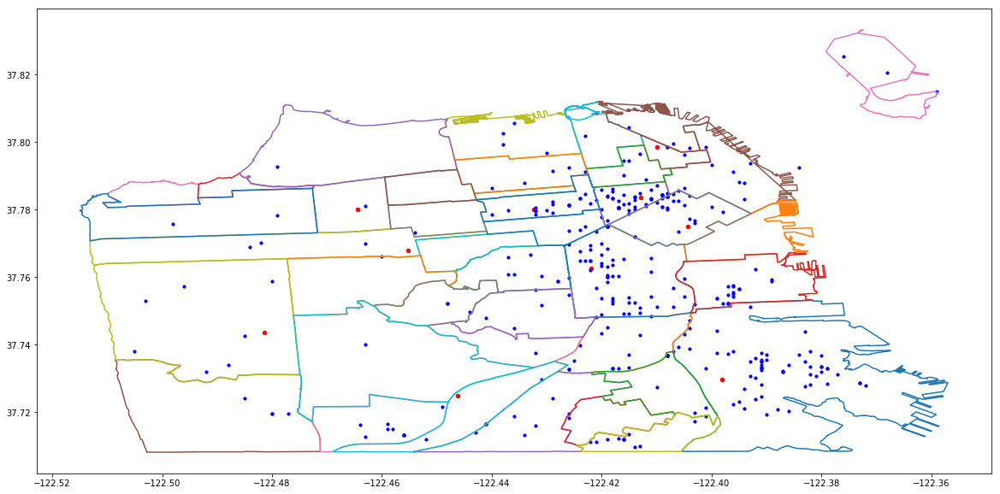

In [49]:
#plot SF incidents and SF police station locations.
sf_shape = gun_sf17[gun_sf17['latitude'] >= 37.7] 
# pip install pyshp
import shapefile as shp

sf = shp.Reader("C:/Users/applewin/Desktop/shapefile/geo_export_0e3a6644-665d-47ae-a94e-f5e4050311d1.shp" )
#shapefile credit to: https://data.sfgov.org/Geographic-Locations-and-Boundaries/Analysis-Neighborhoods/p5b7-5n3h
plt.figure()
f, ax = plt.subplots(figsize=(20,10))
for shape in sf.shapeRecords():
    x = [i[0] for i in shape.shape.points[:]]
    y = [i[1] for i in shape.shape.points[:]]
    plt.plot(x,y)
plt.scatter(police_location['longitude'], police_location['latitude'], color = 'red',s = 20)
plt.scatter(sf_shape['longitude'], sf_shape['latitude'], color = 'blue', s = 10)
plt.show()

__Below are the plots we did not put in the report__

In [ ]:
#plot timewise death rate
gun_by_year['death_rate'] = gun_by_year['n_killed']/gun_by_year['total']
gun_by_year['death_rate'].iplot(kind = 'bar', xTitle = 'year', yTitle = "death rate", 
                                title ="Death rate for each year in California",filename='death rate', world_readable=True)

In [ ]:
gun_by_month['death_rate'] = gun_by_month['n_killed']/gun_by_month['total']
gun_by_month['death_rate'].iplot(kind = 'bar', 
                                 xTitle = 'month', yTitle = "death rate", 
                                 title ="Death rate for each month in California",filename='death rate month', world_readable=True)

In [ ]:
gun_by_weekday['death_rate'] = gun_by_weekday['n_killed']/gun_by_weekday['total']
gun_by_weekday['death_rate'].iplot(kind = 'bar', xTitle = 'weekday', yTitle = "death rate", 
                                   title ="Death rate for each weekday in California",filename='death rate weekday', world_readable=True)

Death rate has no significant difference. They are all around 0.4 with slightly fluctuations. Except 2013 has 0.2 death rate, but consider data for 2013 is not exhaustive, this is not an intuitive result.

In [ ]:
#interactive map for incidents with total number of injured and killed pop up for each point.
import folium         # conda install -c conda-forge folium
df = gun_ca17[gun_ca17.latitude.notna() & gun_ca17.longitude.notna()]

In [ ]:
#get the map
m = folium.Map(location = [33.90, -119.00], zoom_start = 11)

cols = ["total", "latitude", "longitude"]
for total, lat, lng in df[cols].itertuples(index = False):
    popup = folium.Popup(total, parse_html = True)
    circle = folium.Circle([float(lat), float(lng)], radius = 20, popup = popup)
    m.add_child(circle)

fig = folium.Figure(width = 800, height = 400)
fig.add_child(m)
fig.save("incidents.html")

This seems like a duplicate of the shapefile map for San francisco so we did not include it.